## German Apartment Rent Prediction


### Business Problem


The problem is that property owners or landlords list their apartments for rent, either underestimating or overesitamting the price. 
This project focuses on creating an ML pipeline that can predict property rent fairly, based on its features. 

This matters because if property owners are allowed to overestimate rent prices on the platform, it causes a domino effect: potential customers get dissatisfied and leave, the platform's reputation gets worse, and that leads to less revenue and profit. Additionally, newcomers could also be unaware that they are being overcharged monthly.

####  Task Formulation 
This project is a supervised regression task; the objective is to predict the total rent based on the features such as living space, number of rooms, city, and many others.

#### Information about the dataset
The data for this project has been collected from the website Kaggle. The data is stored  in a single csv file. It contains information about apartments that were available for rent on the Immoscout24 website. The link to the data source: https://www.kaggle.com/datasets/corrieaar/apartment-rental-offers-in-germany

Github Repository: https://github.com/Khaled2027/ML_Project



In [113]:
import pandas as pd
import numpy as np

import plotly.express as px
import seaborn as sns
import matplotlib.pyplot as plt

import joblib

import sklearn
from sklearn.model_selection import train_test_split

from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler, OneHotEncoder, TargetEncoder

from sklearn.linear_model import LinearRegression
from sklearn.neighbors import KNeighborsRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.svm import SVR

from sklearn.metrics import mean_absolute_error, root_mean_squared_error, r2_score

from sklearn.model_selection import GridSearchCV
from sklearn.cluster import KMeans

### Data Loading & Explorlation

In [114]:
df=pd.read_csv('immo_data.csv')
print(f"The shape of the dataframe is: {df.shape}")
df.info()

The shape of the dataframe is: (268850, 49)
<class 'pandas.DataFrame'>
RangeIndex: 268850 entries, 0 to 268849
Data columns (total 49 columns):
 #   Column                    Non-Null Count   Dtype  
---  ------                    --------------   -----  
 0   regio1                    268850 non-null  str    
 1   serviceCharge             261941 non-null  float64
 2   heatingType               223994 non-null  str    
 3   telekomTvOffer            236231 non-null  str    
 4   telekomHybridUploadSpeed  45020 non-null   float64
 5   newlyConst                268850 non-null  bool   
 6   balcony                   268850 non-null  bool   
 7   picturecount              268850 non-null  int64  
 8   pricetrend                267018 non-null  float64
 9   telekomUploadSpeed        235492 non-null  float64
 10  totalRent                 228333 non-null  float64
 11  yearConstructed           211805 non-null  float64
 12  scoutId                   268850 non-null  int64  
 13  noParkSpace

In [115]:
def display_columns_in_group(dataframe,group_size):
    display_five_col_dict={}
    x=0
    for name, values in dataframe.items():
        x+=1
        display_five_col_dict[name]=[values[0],values[1],values[2],values[3],values[4]]
        display_five_col_dict=pd.DataFrame(display_five_col_dict)
        if x%group_size==0:
            print(display_five_col_dict)
            display_five_col_dict={}
        else:
            continue

display_columns_in_group(df,3)

                regio1  serviceCharge                     heatingType
0  Nordrhein_Westfalen         245.00                 central_heating
1      Rheinland_Pfalz         134.00  self_contained_central_heating
2              Sachsen         255.00                   floor_heating
3              Sachsen          58.15                district_heating
4               Bremen         138.00  self_contained_central_heating
  telekomTvOffer  telekomHybridUploadSpeed  newlyConst
0  ONE_YEAR_FREE                       NaN       False
1  ONE_YEAR_FREE                       NaN       False
2  ONE_YEAR_FREE                      10.0        True
3  ONE_YEAR_FREE                       NaN       False
4            NaN                       NaN       False
   balcony  picturecount  pricetrend
0    False             6        4.62
1     True             8        3.47
2     True             8        2.72
3     True             9        1.53
4     True            19        2.46
   telekomUploadSpeed  total

In [116]:
print(f"The total number of duplicated rows: {df.duplicated().sum()}")
print("-"*60)
print("The precentage of missing values per column:")
df.isnull().sum()/len(df)*100 


The total number of duplicated rows: 0
------------------------------------------------------------
The precentage of missing values per column:


regio1                       0.000000
serviceCharge                2.569834
heatingType                 16.684397
telekomTvOffer              12.132788
telekomHybridUploadSpeed    83.254603
newlyConst                   0.000000
balcony                      0.000000
picturecount                 0.000000
pricetrend                   0.681421
telekomUploadSpeed          12.407662
totalRent                   15.070485
yearConstructed             21.218151
scoutId                      0.000000
noParkSpaces                65.388879
firingTypes                 21.188023
hasKitchen                   0.000000
geo_bln                      0.000000
cellar                       0.000000
yearConstructedRange        21.218151
baseRent                     0.000000
houseNumber                 26.415473
livingSpace                  0.000000
geo_krs                      0.000000
condition                   25.474800
interiorQual                41.906267
petsAllowed                 42.615957
street      

In [117]:
def count_nunuique_for_each_col(columns):
    x=0
    last_column=columns[-1]
    
    for column in columns:
        x+=1
        print(f"The number of unique values for {column}: {df[column].nunique()}")
        if x%3==0 and column==last_column:
            pass 
        elif x%3==0:
            print("Continued"+"."*35+">")
           

columns_list=["regio1","geo_bln","typeOfFlat","heatingType","firingTypes"
              ,"petsAllowed","geo_krs","regio2","condition",
              "yearConstructed"]

count_nunuique_for_each_col(columns_list)


The number of unique values for regio1: 16
The number of unique values for geo_bln: 16
The number of unique values for typeOfFlat: 10
Continued...................................>
The number of unique values for heatingType: 13
The number of unique values for firingTypes: 132
The number of unique values for petsAllowed: 3
Continued...................................>
The number of unique values for geo_krs: 419
The number of unique values for regio2: 419
The number of unique values for condition: 10
Continued...................................>
The number of unique values for yearConstructed: 465


In [118]:
def are_the_two_columns_equal(column_one,column_two):
    print(f" {column_one} has the same values as {column_two}: {df[column_one].equals(df[column_two])}")

are_the_two_columns_equal('regio1','geo_bln')
are_the_two_columns_equal('regio2','geo_krs')


 regio1 has the same values as geo_bln: True
 regio2 has the same values as geo_krs: True


In [119]:
def display_value_count_for_columns(columns):
    last_col=columns[-1]
    for column in columns:
        if last_col==column: 
            print(f"Column Name: {df[column].value_counts()}")
        else:
            print(f"Column Name: {df[column].value_counts()}")
            print("."*40)

        
columns_list=["typeOfFlat","geo_plz",
              "yearConstructed","condition"]
display_value_count_for_columns(columns_list)

Column Name: typeOfFlat
apartment              131522
roof_storey             34787
ground_floor            31538
other                    9519
maisonette               9319
raised_ground_floor      5628
penthouse                3568
terraced_flat            3385
half_basement            2013
loft                      957
Name: count, dtype: int64
........................................
Column Name: geo_plz
9130     2008
9126     1994
9131     1649
9112     1626
9113     1416
         ... 
79291       1
7616        1
74214       1
84437       1
82390       1
Name: count, Length: 7634, dtype: int64
........................................
Column Name: yearConstructed
2019.0    10959
1900.0    10356
2018.0     8759
1995.0     4387
1996.0     4339
          ...  
1621.0        1
1440.0        1
1601.0        1
1796.0        1
1472.0        1
Name: count, Length: 465, dtype: int64
........................................
Column Name: condition
well_kept                             66591
r

In [120]:
# Returns a Statistical summary
df.describe()

,serviceCharge,telekomHybridUploadSpeed,picturecount,pricetrend,telekomUploadSpeed,totalRent,yearConstructed,scoutId,noParkSpaces,yearConstructedRange,...,noRooms,thermalChar,floor,numberOfFloors,noRoomsRange,livingSpaceRange,heatingCosts,lastRefurbish,electricityBasePrice,electricityKwhPrice
count,261941.000000,45020.0,268850.000000,267018.000000,235492.000000,2.283330e+05,211805.000000,2.688500e+05,93052.000000,211805.000000,...,268850.000000,162344.000000,217541.000000,171118.000000,268850.000000,268850.000000,85518.000000,80711.000000,46846.000000,46846.000000
mean,151.206113,10.0,9.791958,3.389001,28.804928,9.013315e+02,1966.400590,1.069697e+08,1.327634,3.714544,...,2.641261,114.749533,2.122405,3.572319,2.571542,3.070790,76.990866,2013.904536,89.113612,0.199769
std,308.295790,0.0,6.408399,1.964874,16.337151,3.323833e+04,46.992207,1.250093e+07,8.361403,2.738134,...,2.633440,61.653663,3.634934,6.375496,0.937594,1.407127,147.716278,10.963125,5.395805,0.009667
min,0.000000,10.0,0.000000,-12.330000,1.000000,0.000000e+00,1000.000000,2.887174e+07,0.000000,1.000000,...,1.000000,0.100000,-1.000000,0.000000,1.000000,1.000000,0.000000,1015.000000,71.430000,0.170500
25%,95.000000,10.0,6.000000,2.000000,10.000000,4.698000e+02,1950.000000,1.066910e+08,1.000000,1.000000,...,2.000000,79.000000,1.000000,2.000000,2.000000,2.000000,54.000000,2012.000000,90.760000,0.191500
50%,135.000000,10.0,9.000000,3.390000,40.000000,6.500000e+02,1973.000000,1.111584e+08,1.000000,3.000000,...,3.000000,107.000000,2.000000,3.000000,3.000000,3.000000,70.000000,2017.000000,90.760000,0.198500
75%,190.000000,10.0,13.000000,4.570000,40.000000,9.850000e+02,1996.000000,1.137688e+08,1.000000,5.000000,...,3.000000,140.300000,3.000000,4.000000,3.000000,4.000000,90.000000,2019.000000,90.760000,0.205500
max,146118.000000,10.0,121.000000,14.920000,100.000000,1.575154e+07,2090.000000,1.157117e+08,2241.000000,9.000000,...,999.990000,1996.000000,999.000000,999.000000,5.000000,7.000000,12613.000000,2919.000000,90.760000,0.227600


In [121]:
fig = px.scatter(df, x="noRooms", y="livingSpace",color="noRooms")

fig.update_layout(
            title={
            'text' : 'Number of Rooms vs Living Space',
            'x': 0.5,
            'xanchor': 'center'
        },
    xaxis=dict(
        title=dict(
            text="Number Of Rooms"
        )
    ),
    yaxis=dict(
        title=dict(
            text="Living Space (in sqm)"
        )
    ))
fig.show()


###  Does the dataset require any sampling or balancing techniques? Which evaluation metrics fit this dataset?

The dataset does not require sampling because 200,000 rows are sufficient for Scikit-learn and the computer to handle. Furthermore, it does not require any balancing techniques since this is a regression project, not a classification project. 

The evaluation metrics that are suitable for this project are: 

- R-squared: the proportion of variance in total rent explained by the model.
- RMSE (root mean squared error): the difference between the predicted total rent and the actual total rent value.
- MAE (Mean absolute error): shows how many euros the predicted rent is off on average.
***

### Data Quality Issues

The dataset suffers from multiple data quality issues 

- Missing values greater than 50%: The dataset contains 7 columns that have more than 50 percent null values. Imputing them would result in half of the data being biased. As a result, these columns were dropped entirely. 

- Columns with redundant values: Certain columns had different names but contained identical data. 'regio1' and 'geo_bln' are string columns that share the same number of unique values and contain information about the German state where the apartment is located. Furthermore, 'regio2' and 'geo_krs' are a string columns that share the same number of unique values and contain information about the German city where the apartment is located at. 

- Column with an invalid category value: For the 'condition' column, which is a string column, some rows had the following value 'ripe_for_demolition'. This means that the apartment building has been left neglected for a long period, and is ready for demolition. This is not an apartment that should be listed for the safety of people. 

- Missing values less than 50%: The target column 'totalRent' contained 15 percent missing values, and 'pricetrend' contained 0.68% missing values.

-  The result of the describe function showed that there were outliers for the ‘totalRent’ column where the max value was at 15 million and the minimum was at 0; the 'noRooms' (number of rooms) maximum value was at 560 rooms which is unrealistic; the 'livingSpace' maximum was at 111,111 sqm and the minimum value was at 0 sqm; the 'yearConstructed' column was at 2090 despite the fact that the data was extracted from 2019. Moreover, the minimum value was at 1000; the 'floor' maximum value was at 999 which is impossible; and for 'thermalChar' (energy consumption value) minimum was at 0, and the max at 1983, which is too high and unrealistic.

- Lastly, a bivariate analysis was done on the 'livingSpace' column and 'noRooms' (number of rooms) column as plotted in Figure 1, where we can see some unrealistic outliers. The plot has the number of rooms ranging from 0 to 1000. 



### Data Preprocessing

In [122]:
df=df[df['condition']!='ripe_for_demolition']
# Drops unwanted columns
df=df.drop(columns=["regio1","serviceCharge","telekomTvOffer","telekomUploadSpeed","picturecount","houseNumber","yearConstructedRange","scoutId","baseRent"
                    ,"street","geo_krs","streetPlain","baseRentRange","telekomHybridUploadSpeed","noParkSpaces","firingTypes","geo_bln","numberOfFloors","regio3"
                    ,"description", "facilities","heatingCosts","energyEfficiencyClass","lastRefurbish","electricityBasePrice","electricityKwhPrice"
                    ,"date","noRoomsRange","livingSpaceRange"])

df= df.dropna(subset=["pricetrend","totalRent"])

convert_bolColumns_to_str_dict = {"newlyConst": str, "balcony": str,"hasKitchen":str,"cellar":str,"lift":str,"garden":str}
df=df.astype(convert_bolColumns_to_str_dict)

df=df.rename(columns={"regio2": "city"})

In [123]:
# Removing outliers 
df=df[df['floor']<=21]
df=df[df['noRooms']<=12]
df=df[(df['livingSpace']>=6) &(df['livingSpace']<=800)]
df=df[(df['yearConstructed']>=1624)&(df['yearConstructed']<=2019)]
df=df[(df['totalRent']>=200) &(df['totalRent']<=4000)]
df=df[(df['thermalChar']>=10) &(df['thermalChar']<=400)]



df.describe()

,pricetrend,totalRent,yearConstructed,livingSpace,geo_plz,noRooms,thermalChar,floor
count,103849.000000,103849.000000,103849.000000,103849.000000,103849.000000,103849.000000,103849.000000,103849.000000
mean,3.226561,747.624525,1966.158807,69.412154,32746.565147,2.579242,112.537272,2.225395
std,2.075176,473.605165,36.797464,26.963134,27054.682956,0.912023,49.127207,1.762481
min,-12.330000,200.000000,1633.000000,8.000000,1057.000000,1.000000,10.000000,-1.000000
25%,1.790000,446.000000,1951.000000,53.090000,8523.000000,2.000000,79.200000,1.000000
50%,3.170000,590.000000,1971.000000,64.500000,28201.000000,3.000000,105.200000,2.000000
75%,4.410000,890.000000,1994.000000,80.000000,47623.000000,3.000000,137.900000,3.000000
max,12.870000,4000.000000,2019.000000,482.000000,99994.000000,12.000000,400.000000,21.000000


### Solution for data quality issues 

- Missing values greater than 50%: These columns were dropped entirely. 

- Columns with redundant values: The 'geo_bln' and 'geo_krs' columns were dropped. 

- Column with an invalid category value: The dataset has been filtered to exclude rows with "ripe_for_demolition".

- These columns were filtered as follows: the 'totalRent' minimum was set to 200 and the maximum was set to 4,000 Euros. The 'livingSpace' minimum value was set to 6 sqm, as this is the minimum size per room according to German law. The 'thermalChar' (energy consumption value) minimum was set to 10 and the maximum to 400. The 'floor' maximum value was filtered to 21, and finally, the 'noRooms' (number of rooms) mainimum was set to 1.

In [124]:
df_totalRent = df['totalRent']
fig = px.histogram(df_totalRent, x="totalRent")

fig.update_layout(
            title={
            'text' : 'Histogram of Total Rent',
            'x': 0.5,
            'xanchor': 'center'
        },
    xaxis=dict(
        title=dict(
            text="Total Rent"
        )
    ),
    yaxis=dict(
        title=dict(
            text="Frequency"
        )
    ))
fig.show() 

In [125]:
fig = px.scatter(df, x="noRooms", y="livingSpace",color="noRooms")

fig.update_layout(
            title={
            'text' : 'Number of Rooms vs Living Space',
            'x': 0.5,
            'xanchor': 'center'
        },
    xaxis=dict(
        title=dict(
            text="Number Of Rooms"
        )
    ),
    yaxis=dict(
        title=dict(
            text="Living Space (in sqm)"
        )
    ))
fig.show()

### Post-Filtering Data Quality Issues:
Despite filtering the 'noRooms' column, the following issues were discovered: the 'noRooms' (number of rooms) column contains values such as 2.1 and 2.3 that do not make any sense, or cases where 'noRooms' is 12 and the 'livingSpace' is 37.01, which is not realistic at all.

In [126]:
roomNumbers_list_one=[x+0.5 for x in range(1,12)]
roomNumbers_list_two=[x for x in range(1,13)]

room_numbers_list=roomNumbers_list_one+roomNumbers_list_two

df= df[df['noRooms'].isin(room_numbers_list)]


df['SizePerRoom']= df['livingSpace']/df['noRooms']
df=df[((df['SizePerRoom']>=6) &(df['SizePerRoom']<=60))]

fig = px.scatter(df, x="noRooms", y="livingSpace",color="noRooms")
fig.update_layout(
            title={
            'text' : 'Number of Rooms vs Living Space (after removing outliers and unrealistic values)',
            'x': 0.5,
            'xanchor': 'center'
        },
    xaxis=dict(
        title=dict(
            text="Number Of Rooms"
        )
    ),
    yaxis=dict(
        title=dict(
            text="Living Space (in sqm)"
        )
    ))


### Solution for Post-Filtering Issue
The solution was to keep only 'noRooms' values that are whole numbers or end in .5, as half-rooms exist in German apartments. Additionally, I feature-engineered a new column 'sizePerRoom', which was then flitered to a minimum of 6 sqm (the minimum size per room in Germany according to the law) and a maximum of 60 sqm.
***

### Train Test Split 

In [127]:
X=df.copy()
y=df["totalRent"]

X_train, X_test, y_train, y_test = train_test_split(X,y,random_state=42,train_size=0.8,shuffle=True)

X_train=X_train.drop(columns=["totalRent"])
X_test=X_test.drop(columns=["totalRent"])

In [128]:
# Replacing Missing values
def fillna_for_columns(df,columns,value):
    for column in columns:
        df[column]=df[column].fillna(value)
fillna_for_columns(X_train,["heatingType","condition","interiorQual","petsAllowed"],"unknown")

X_train['yearConstructed']=X_train['yearConstructed'].fillna(
X_train['yearConstructed'].median())

X_train.loc[(X_train["thermalChar"].isnull()),'thermalChar']=X_train['thermalChar'].median()

X_train=X_train[~((X_train['typeOfFlat'].isnull())&(X_train['floor'].isnull()))]

X_train.loc[(X_train['typeOfFlat']=='ground_floor')&(X_train["floor"].isnull()),'floor']=0.0
X_train.loc[(X_train['typeOfFlat']=='raised_ground_floor')&(X_train["floor"].isnull()),'floor']=1.0

X_train.loc[(X_train['typeOfFlat']=='penthouse')&(X_train["floor"].isnull()),'floor']=X_train[X_train['typeOfFlat']=='penthouse']['floor'].median()
X_train.loc[(X_train['typeOfFlat']=='other')&(X_train["floor"].isnull()),'floor']=X_train[X_train['typeOfFlat']=='other']['floor'].median()
X_train.loc[(X_train['typeOfFlat']=='terraced_flat')&(X_train["floor"].isnull()),'floor']=X_train[X_train['typeOfFlat']=='terraced_flat']['floor'].median()
X_train.loc[(X_train['typeOfFlat']=='roof_storey')&(X_train["floor"].isnull()),'floor']=X_train[X_train['typeOfFlat']=='roof_storey']['floor'].median()

X_train.loc[(X_train['typeOfFlat']=='apartment')&(X_train["floor"].isnull()),'floor']=X_train[X_train['typeOfFlat']=='apartment']['floor'].median()
X_train.loc[(X_train['typeOfFlat']=='half_basement')&(X_train["floor"].isnull()),'floor']=X_train[X_train['typeOfFlat']=='half_basement']['floor'].median()
X_train.loc[(X_train['typeOfFlat']=='loft')&(X_train["floor"].isnull()),'floor']=X_train[X_train['typeOfFlat']=='loft']['floor'].median()

X_train.loc[(X_train['typeOfFlat']=='maisonette')&(X_train["floor"].isnull()),'floor']=2.0

fillna_for_columns(X_train,['typeOfFlat'],"unknown")

# Checks if there are any missing vlaues left
X_train.isnull().sum()

heatingType        0
newlyConst         0
balcony            0
pricetrend         0
yearConstructed    0
hasKitchen         0
cellar             0
livingSpace        0
condition          0
interiorQual       0
petsAllowed        0
lift               0
typeOfFlat         0
geo_plz            0
noRooms            0
thermalChar        0
floor              0
garden             0
city               0
SizePerRoom        0
dtype: int64

The column 'yearConstructed' had roughly 20% missing values that were imputed with the median year.

Categorical columns such as heatingType, condition, interiorQual, petsAllowed, and typeOfFlat had their missing values imputed with “unknown”, as this was the safest choice to avoid introducing any bias.

For the column 'floor', missing values were replaced using the .loc() method where I created a condition based on the type of flat and imputed by the median; an exception was made for ground_floor and raised_ground_floor, where ground_floor was set to 0 and raised_ground_floor was set to 1.


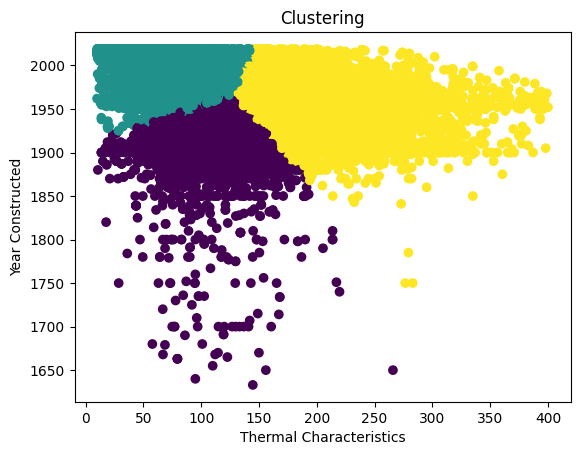

In [129]:

y_pred = KMeans(n_clusters=3,random_state=42).fit_predict(X_train[['thermalChar','yearConstructed']]
    
)
plt.scatter(x=X_train['thermalChar'],y=X_train['yearConstructed'], c=y_pred)
plt.title("Clustering")
plt.xlabel("Thermal Characteristics")
plt.ylabel("Year Constructed")
plt.show()

In the visual above, K-means clustering was used to group the Year Constructed and Thermal Characteristics points into 3 different groups.

In [130]:
numerical_features =['pricetrend','yearConstructed','livingSpace','geo_plz'
                     , 'noRooms','thermalChar', 'floor', 'SizePerRoom']

numeric_transformer = Pipeline(
    steps=[("imputer", SimpleImputer(strategy="median")), ("scaler", StandardScaler())]
)
categorical_features = ['heatingType', 'newlyConst', 'balcony', 
       'hasKitchen', 'cellar', 'condition', 'interiorQual',
       'petsAllowed', 'lift', 'typeOfFlat', 'garden']

categorical_transformer = Pipeline(
    steps=[
        ("imputer", SimpleImputer(strategy="constant",fill_value='unknown')),("onehot", OneHotEncoder(handle_unknown="ignore"))
    ]
)
categorical_target_features=['city']

categorical_target_transformer = Pipeline(
    steps=[("target", TargetEncoder(random_state=42))
    ]
)

preprocessor = ColumnTransformer(
    transformers=[
        ("num", numeric_transformer, numerical_features),
        ("cat", categorical_transformer, categorical_features),
        ("cat_target",categorical_target_transformer,categorical_target_features)
    ]
)

I created three variables: one for numerical features which contains all the numerical columns, one for categorical features containing all the categorical columns including the boolean-type columns that were converted into strings earlier, and a third variable named categorical_target_features which contains one categorical column that is 'city'. 

I used a scikit-learn pipeline to allow the model to handle sample data easily, and to ensure that if a model is deployed, a user can enter categorical values while the pipeline handles the translation into numerical values under the hood. I then created the numerical_transformer, which takes the numerical features, replaces any missing values with the median, and applies scaling. The categorical transformer replaces any missing values with unknown and applies one-hot encoding. Lastly, the categorical_target_transformer applies target encoding to the 'city' column with a constant random state so that R-sqaured score does not fluctuate. All of these transformations are handled with the ColumnTransformer method.
***

I selected four regression models: Linear Regression, K-Nearst Neigbhors, Random Forest, and Suppor Vector Regression, becuase each one works differently.

### Linear Regression


In [131]:
liner_reg=clf = Pipeline(
    steps=[
        ("preprocessor", preprocessor),
        ("reg",LinearRegression()),
    ]
)

liner_reg.fit(X_train,y_train)

y_pred = liner_reg.predict(X_test)

linerReg_mae= mean_absolute_error(y_test,y_pred)
linearReg_Rmse=root_mean_squared_error(y_test,y_pred)
linearReg_R_squared_score=r2_score(y_test,y_pred)



### Knn

In [132]:
knn_reg=clf = Pipeline(
    steps=[
        ("preprocessor", preprocessor),
        ("reg",KNeighborsRegressor()),
    ]
)

knn_reg.fit(X_train,y_train)

y_pred = knn_reg.predict(X_test)

KnnReg_mae= mean_absolute_error(y_test,y_pred)
KnnReg_Rmse=root_mean_squared_error(y_test,y_pred)
KnnReg_R_squared_score=r2_score(y_test,y_pred)


### Random Forest

In [133]:
RandomForest_reg=clf = Pipeline(
    steps=[
        ("preprocessor", preprocessor),
        ("reg",RandomForestRegressor(random_state=42,n_jobs=1)),
    ]
)

RandomForest_reg.fit(X_train,y_train)

y_pred = RandomForest_reg.predict(X_test)

RandomForest_reg_mae= mean_absolute_error(y_test,y_pred)
RandomForest_reg_Rmse=root_mean_squared_error(y_test,y_pred)
RandomForest_reg_R_squared_score=r2_score(y_test,y_pred)


### SVR

In [134]:
SVR_reg=clf = Pipeline(
    steps=[
        ("preprocessor", preprocessor),
        ("reg",SVR(kernel='rbf')),
    ]
)

SVR_reg.fit(X_train,y_train)

y_pred = SVR_reg.predict(X_test)

SVR_reg_mae= mean_absolute_error(y_test,y_pred)
SVR_reg_Rmse=root_mean_squared_error(y_test,y_pred)
SVR_reg_R_squared_score=r2_score(y_test,y_pred)

### Model Evaluation Results & Comparison

In [135]:
model_scores = pd.DataFrame({"Model":["Linear Regression","Knn","Random_Forest","Svr"],
               "Mae_Score":[linerReg_mae,KnnReg_mae,RandomForest_reg_mae,SVR_reg_mae],
               "Rmse_Score":[linearReg_Rmse,KnnReg_Rmse,RandomForest_reg_Rmse,SVR_reg_Rmse],
               "R_Squared_Score": [linearReg_R_squared_score,KnnReg_R_squared_score,RandomForest_reg_R_squared_score,SVR_reg_R_squared_score]})


# Sorts the Dataframe by the lowest Rmse score to the highest 
model_scores_sorted= model_scores.sort_values(by='Rmse_Score', ascending=True)
model_scores_sorted.head()

,Model,Mae_Score,Rmse_Score,R_Squared_Score
2,Random_Forest,75.804399,132.759581,0.919834
0,Linear Regression,115.600625,180.715610,0.851457
1,Knn,118.052650,191.391288,0.833389
3,Svr,218.130841,362.995798,0.400674


In the final results, the best model was the Random Forest. It outperformed all the other models, it had the highest R-squared score at 0.92, the lowest RMSE, and the lowest MAE. All of these results were stored inside a dataframe I created, which contains four columns: model (the name of the model), MAE score, RMSE score, R-squared score, and the rows were sorted by the highest R-squared score.
 

### Hyperparameter Tuning

In [136]:
param_grid = {
    'reg__n_estimators': [100,150,200],
    'reg__max_features': [0.25, 0.5,1],
    'reg__max_depth':  [5,10,15] 
}

grid_search = GridSearchCV(RandomForest_reg, param_grid,cv=5,n_jobs=1,verbose=1)
grid_search.fit(X_train, y_train)
print("The best parameter is: ",grid_search.best_params_)
print("The best score is:",grid_search.best_score_)

Fitting 5 folds for each of 27 candidates, totalling 135 fits
The best parameter is:  {'reg__max_depth': 15, 'reg__max_features': 0.5, 'reg__n_estimators': 200}
The best score is: 0.9183727156755905


The following parameters were chosen for tuning the best model

- n_estimators: the number of decision trees.
- max_depth: the maximum depth of the trees.
- max_features: the number of features used.

Each of these arguments was given a list with three values, to find the best parameters, the GridSearchCV method was used to evaluate all 27 possible combinations using 5-fold cross-validation. 

- n_estimators: the three values were 100, 150, and 200.
- max_features: the three values were 0.25 (uses only 25% of the features), 0.5(uses 50% of the features), and 1 (uses all the features). 
- max_depth: the three values were 5, 10, and 15.

In the end, the best parameters were n_estimators equal to 200, max_features set to 0.5, and max_depth equal to 15. However, the R-squared score dropped slightly to 0.918.


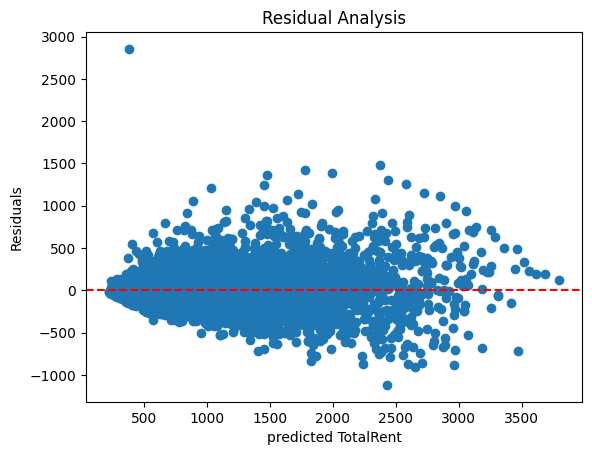

In [137]:
best_model=grid_search.best_estimator_

test_data_pred= best_model.predict(X_test)
residual = y_test - test_data_pred

plt.scatter(test_data_pred, residual)
plt.axhline(y=0, color='r', linestyle='--')
plt.title("Residual Analysis")
plt.xlabel("predicted TotalRent")
plt.ylabel("Residuals")
plt.show()


In the residual plot, the y-axis represents the residuals and the x-axis represents the predicted total rent values. The visual shows that as the rent increases, the spread of points with higher positive residuals or larger negative residuals increases. This means the model predicts rents with lower prices at a much more accurate level, while predictions for higher-priced apartments show larger errors; indicating heteroscedasticity.


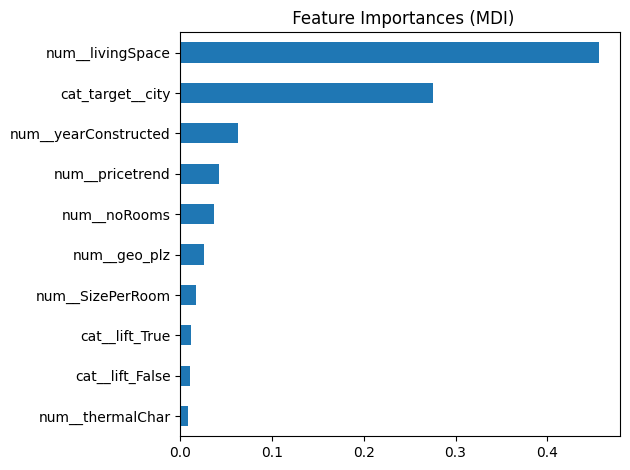

In [138]:

feature_names = best_model[:-1].get_feature_names_out()

feautre_importances = pd.Series(
    best_model[-1].feature_importances_, index=feature_names
).sort_values(ascending=True).tail(10)

ax = feautre_importances.plot.barh()
ax.set_title(" Feature Importances (MDI)")
ax.figure.tight_layout()



In [139]:
# Created a new dataset sample 
sample_data= pd.DataFrame ({'heatingType':['central_heating'], 'newlyConst':['False'], 'balcony':['True'], 'pricetrend':[2], 'yearConstructed':[2010],
       'hasKitchen':['True'], 'cellar':['True'], 'livingSpace':[30], 'condition':['well_kept'], 'interiorQual':['normal'],
       'petsAllowed':['Yes'], 'lift':['True'], 'typeOfFlat':['ground_floor'], 'geo_plz':[44269], 'noRooms':[2],
       'thermalChar':[100], 'floor':[2], 'noRoomsRange':[2], 'garden':['False'],
       'SizePerRoom':[8],'city':['Dortmund']
    
})

# Displays the predicted value based on the given sample data 
pred = best_model.predict(sample_data)
print("Prediction: ",pred)

Prediction:  [448.38152972]


In [140]:
joblib.dump(best_model, 'best_model_compressed.joblib',compress=9)
X_train.to_csv('train_data.csv')

### Strengths 
- Reliable Pipeline: Used Scikit-learn pipeline for data preprocessing and to avoid data leakage.
- High Accuracy: Achieved an R-squared score of approx 0.92.
- Functional Deployment: Deployed the best model using Joblib and Streamlit.

### Limitations
- The dataset is from 2019, so the predictions do not reflect the recent years or current market conditions.
- Several columns contained missing values that required dropping or imputation, meaning the data used by the model relied partially on approximated values rather than purely true values.

### Business Recommendations
Create and deploy a machine learning model directly onto the platform to provide real-time market estimates of total rent derived from apartment characteristics. This helps landlords receive accurate rent benchmarks while protecting prospective renters from overpaying in the future.


### Is the model explainble?  
Yes, the model is explainable because of the residual plot and feature importance. Furthermore, 
The feature importance (last figure above) shows the top 10 most important features that have the highest infleunce on the model.
The number one feature is the living space, which has an importance value greater than 0.4; this shows how essential size is in influencing the rent. In second place, we have the city with a value of 0.3, because apartments with the same size can have very different rental prices, depednding on the city. Year Constructed is in third place with an importance of 0.1, and in fourth place we have price trend, in  fifth place is noRooms (number of rooms), meaning apartments with more rooms cost more to rent. geo_plz (postal code) is in sixth place; this represents the neighborhood, as two apartments with the same features can still vary in price based on their neighborhood. Space per room is in seventh place, we have lift_false at eighth  and lift_true is at ninth; having an elevator influences the price because a lift involves installation and regular maintenance fees.Finanlly, we have thermal characteristics (the amount of energy that the building consumes) at tenth place. 



### Is the model deployable?
Yes, it is. The model is deployed on Streamlit using Joblib library for exporting the model and with Pandas utilized for data preparation on train_data.csv.

Link to the deployed model: https://mlproject-vzj2nagv5jneohfvxnvkn9.streamlit.app/

Link to the deployed model's code: https://github.com/Khaled2027/ML_Project/blob/main/Rent_app.py



### References


- Analytics Vidhya (2020) Deploying machine learning models using Streamlit: an introductory guide to model deployment. Available at: https://www.analyticsvidhya.com/blog/2020/12/deploying-machine-learning-models-using-streamlit-an-introductory-guide-to-model-deployment/ 

- Joblib (2026) Serialization and memory-mapped loading. Available at: https://joblib.readthedocs.io/en/stable/user_guide/persistence.html  
- ONNX (n.d.) Complex pipeline conversion from scikit-learn to ONNX. Available at: https://onnx.ai/sklearn-onnx/auto_examples/plot_complex_pipeline.html 
- pandas (2026) pandas documentation. Available at: https://pandas.pydata.org/docs/.

- Plotly (2026) Plotly Python documentation. Available at: https://plotly.com/python/.
- scikit-learn (2026) scikit-learn: machine learning in Python. Available at: https://scikit-learn.org/stable/.
- Matplotlib (2026) Matplotlib: Visualization with Python. Available at: https://matplotlib.org/.
- Streamlit (2026) Streamlit documentation. Available at: https://docs.streamlit.io/.
- Act on the Elimination of Housing Deficiencies in Berlin (Berlin Housing Supervision Act - WoAufG Bln) (2020), Section 7, Paragraph 2. Available at: https://gesetze.berlin.de/bsbe/document/jlr-WoAufGBErahmen.
